# Fraud Detection

ATM fraud detection is of paramount importance in the banking sector for the following reasons:

1. Financial Loss Prevention: ATM fraud can result in significant financial losses for both banks and customers. Detecting and preventing fraudulent activities helps minimize these losses, ensuring the financial stability of the banking institution and the trust of its customers.

2. Customer Trust and Confidence: Effective ATM fraud detection mechanisms reassure customers that their funds and personal information are secure. Maintaining trust is essential for retaining existing customers and attracting new ones.

3. Reputation Management: A bank's reputation is a critical asset. Incidents of ATM fraud can damage a bank's reputation and lead to a loss of customers. Robust fraud detection and prevention measures demonstrate a commitment to security and can help safeguard a bank's reputation.

4. Operational Efficiency: ATM fraud can lead to operational disruptions, including customer service inquiries, investigations, and card replacements. Efficient fraud detection reduces the workload associated with managing fraudulent transactions.

5. Technological Advancements: As technology evolves, so do the tactics used by fraudsters. Continuous investment in fraud detection systems is essential to stay ahead of emerging threats.

Hence, Fraud detection is a critical component of the banking sector's security framework. It safeguards financial institutions, their customers, and their reputations, while also ensuring regulatory compliance and operational efficiency.

# About Dataset

Building a Fraudelent prediction model, dataset used is provided by an Australian bank, whose profitability and reputation are being hit by fraudulent ATM transactions. They want help in reducing and if possible completely eliminating such fraudulent transactions. This can be done by building a predictive model to catch such fraudulent transactions in real time and decline them. The challenging part of the problem is that the data contains very few fraud instances in comparison to the overall population. To give more edge to the solution they have also collected data regarding location geo_scores of the transactions, their own proprietary index Lambda_wts, on network turn around times Qset_tats and vulnerability qualification score instance_scores. Training data contains masked variables pertaining to each transaction id . The prediction target here is 'Target'.

1: Fraudulent transactions

0: Clean transactions


## Features

### The dataset contains masked variable for both train and test data, to protect the confidentiality.

In [1]:
# Importing required Libraries
import os, sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
sns.set()
pd.set_option('display.max_rows',None)
pd.set_option('display.max_columns',None)
sns.set_style('whitegrid')

In [2]:
# Checking the version of python used as here, EDA is done using Dataprep package and is compatible with 3.10

import sys
print(sys.version)

3.10.13 | packaged by Anaconda, Inc. | (main, Sep 11 2023, 13:24:38) [MSC v.1916 64 bit (AMD64)]


In [3]:
# Loading the datasets

geo_df = pd.read_csv('Geo_scores.csv')
lambda_wts_df = pd.read_csv('Lambda_wts.csv')
qset_df = pd.read_csv('Qset_tats.csv')
instances_df = pd.read_csv('instance_scores.csv')
train_df = pd.read_csv('train.csv')
test_df = pd.read_csv('test_share.csv')

In [4]:
# Columns present in the above datasets

print(geo_df.columns)
print('--'*50)
print('\n')
print(lambda_wts_df.columns)
print('--'*50)
print('\n')
print(qset_df.columns)
print('--'*50)
print('\n')
print(instances_df.columns)
print('--'*50)
print('\n')
print(train_df.columns)
print('--'*50)
print('\n')
print(test_df.columns)
print('--'*50)

Index(['id', 'geo_score'], dtype='object')
----------------------------------------------------------------------------------------------------


Index(['Group', 'lambda_wt'], dtype='object')
----------------------------------------------------------------------------------------------------


Index(['id', 'qsets_normalized_tat'], dtype='object')
----------------------------------------------------------------------------------------------------


Index(['id', 'instance_scores'], dtype='object')
----------------------------------------------------------------------------------------------------


Index(['id', 'Group', 'Per1', 'Per2', 'Per3', 'Per4', 'Per5', 'Per6', 'Per7',
       'Per8', 'Per9', 'Dem1', 'Dem2', 'Dem3', 'Dem4', 'Dem5', 'Dem6', 'Dem7',
       'Dem8', 'Dem9', 'Cred1', 'Cred2', 'Cred3', 'Cred4', 'Cred5', 'Cred6',
       'Normalised_FNT', 'Target'],
      dtype='object')
----------------------------------------------------------------------------------------------------


I

Now since the data is distributed among different tables, the task is to group all the data into one dataframe which can aid in data preprocesing, analysis and model building.

In [5]:
# To do this first the missing values are to be handled, missing values are handled individually to avoid the problem of data
# leakage.

print(geo_df.isnull().sum())
print('--'*50)
print('\n')
print(lambda_wts_df.isnull().sum())
print('--'*50)
print('\n')
print(qset_df.isnull().sum())
print('--'*50)
print('\n')
print(instances_df.isnull().sum())
print('--'*50)
print('\n')
print(train_df.isnull().sum())
print('--'*50)
print('\n')
print(test_df.isnull().sum())
print('--'*50)

id               0
geo_score    71543
dtype: int64
----------------------------------------------------------------------------------------------------


Group        0
lambda_wt    0
dtype: int64
----------------------------------------------------------------------------------------------------


id                           0
qsets_normalized_tat    103201
dtype: int64
----------------------------------------------------------------------------------------------------


id                 0
instance_scores    0
dtype: int64
----------------------------------------------------------------------------------------------------


id                0
Group             0
Per1              0
Per2              0
Per3              0
Per4              0
Per5              0
Per6              0
Per7              0
Per8              0
Per9              0
Dem1              0
Dem2              0
Dem3              0
Dem4              0
Dem5              0
Dem6              0
Dem7              0
Dem8

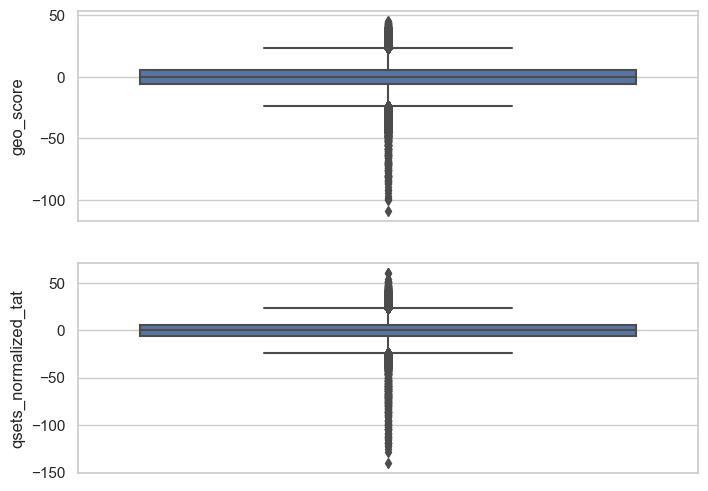

In [6]:
# There are missing values present in only geo_df and qset_df.
# Checking the box plot to check the presence of outliers, if there are outliers present going with median imputation.

plt.figure(figsize=(8,6))
plt.subplot(2,1,1)
sns.boxplot(data=geo_df, y = 'geo_score')
plt.subplot(2,1,2)
sns.boxplot(data=qset_df, y = 'qsets_normalized_tat')
plt.show()

In [7]:
# SInce there is the presence of outliers going with median imputation

geo_df['geo_score'] = geo_df['geo_score'].fillna(geo_df['geo_score'].median())
qset_df['qsets_normalized_tat'] = qset_df['qsets_normalized_tat'].fillna(qset_df['qsets_normalized_tat'].median())

In [8]:
# Confirming that the missing values are handled:

print(geo_df.isnull().sum())
print('--'*50)
print('\n')
print(qset_df.isnull().sum())
print('--'*50)

id           0
geo_score    0
dtype: int64
----------------------------------------------------------------------------------------------------


id                      0
qsets_normalized_tat    0
dtype: int64
----------------------------------------------------------------------------------------------------


In [9]:
# Now checking if there are any duplicate values in all the tables:

print(geo_df.duplicated().sum())
print('--'*50)
print('\n')
print(lambda_wts_df.duplicated().sum())
print('--'*50)
print('\n')
print(qset_df.duplicated().sum())
print('--'*50)
print('\n')
print(instances_df.duplicated().sum())
print('--'*50)
print('\n')
print(train_df.duplicated().sum())
print('--'*50)
print('\n')
print(test_df.duplicated().sum())
print('--'*50)

55349
----------------------------------------------------------------------------------------------------


0
----------------------------------------------------------------------------------------------------


59314
----------------------------------------------------------------------------------------------------


33600
----------------------------------------------------------------------------------------------------


0
----------------------------------------------------------------------------------------------------


0
----------------------------------------------------------------------------------------------------


There are duplicates present in geo_df, qset_df and instances_df, however the same will not be ommited, this is because it is possible and mostly obvious that the same customer with a unique customer ID has made a transaction at the same geographic location, same goes with the time and the instance score.

In [10]:
# Now merging the tables:

print(geo_df['id'].nunique())
print('--'*50)
print('\n')
print(lambda_wts_df['Group'].nunique())
print('--'*50)
print('\n')
print(qset_df['id'].nunique())
print('--'*50)
print('\n')
print(instances_df['id'].nunique())
print('--'*50)
print('\n')
print(train_df['id'].nunique())
print('--'*50)
print('\n')
print(train_df['Group'].nunique())
print('--'*50)
print('\n')
print(test_df['id'].nunique())
print('--'*50)
print('\n')
print(test_df['Group'].nunique())
print('--'*50)

284807
----------------------------------------------------------------------------------------------------


1400
----------------------------------------------------------------------------------------------------


284807
----------------------------------------------------------------------------------------------------


284807
----------------------------------------------------------------------------------------------------


227845
----------------------------------------------------------------------------------------------------


1301
----------------------------------------------------------------------------------------------------


56962
----------------------------------------------------------------------------------------------------


915
----------------------------------------------------------------------------------------------------


Now we can observe that the sum of train data unique values of id and test data unique values of id add up to 284807, which is same as that of geo_df, qset_df and instances_df

In [11]:
227845+56962

284807

In [12]:
# To mark the train and test datasets in the concatenated df lets take a new column data in both train and test representing
# train and test

train_df['Data'] = 'train'
test_df['Data'] = 'test'

In [13]:
# Now merging train and test tables

full_df = pd.concat([train_df, test_df])

In [14]:
# Checking the head of the fuLL_df

full_df.head()

,id,Group,Per1,Per2,Per3,Per4,Per5,Per6,Per7,Per8,Per9,Dem1,Dem2,Dem3,Dem4,Dem5,Dem6,Dem7,Dem8,Dem9,Cred1,Cred2,Cred3,Cred4,Cred5,Cred6,Normalised_FNT,Target,Data
0,112751,Grp169,1.070000,0.580000,0.480000,0.766667,1.233333,1.993333,0.340000,1.010000,0.863333,0.460000,0.643333,0.736667,0.756667,0.813333,0.693333,0.666667,0.680000,0.726667,0.606667,1.010000,0.933333,0.603333,0.686667,0.673333,-245.7500,0.0,train
1,18495,Grp161,0.473333,1.206667,0.883333,1.430000,0.726667,0.626667,0.810000,0.783333,0.190000,0.470000,0.613333,0.883333,0.653333,0.463333,0.483333,0.583333,0.716667,0.743333,0.680000,0.690000,0.560000,0.670000,0.553333,0.653333,-248.0000,0.0,train
2,23915,Grp261,1.130000,0.143333,0.946667,0.123333,0.080000,0.836667,0.056667,0.756667,0.226667,0.660000,0.730000,0.873333,0.923333,1.223333,0.686667,0.606667,0.690000,0.820000,0.600000,0.383333,0.763333,0.670000,0.686667,0.673333,-233.1250,0.0,train
3,50806,Grp198,0.636667,1.090000,0.750000,0.940000,0.743333,0.346667,0.956667,0.633333,0.486667,1.096667,0.466667,0.670000,0.526667,0.783333,0.856667,0.716667,0.720000,0.900000,0.680000,0.846667,0.423333,0.520000,0.846667,0.760000,-249.7775,0.0,train
4,184244,Grp228,0.560000,1.013333,0.593333,0.416667,0.773333,0.460000,0.853333,0.796667,0.516667,0.756667,0.683333,0.296667,0.780000,0.636667,0.783333,0.630000,0.603333,0.486667,0.693333,0.526667,0.520000,0.716667,0.706667,0.673333,-247.5775,0.0,train


In [15]:
# Checking the tail of the fuLL_df

full_df.tail()

,id,Group,Per1,Per2,Per3,Per4,Per5,Per6,Per7,Per8,Per9,Dem1,Dem2,Dem3,Dem4,Dem5,Dem6,Dem7,Dem8,Dem9,Cred1,Cred2,Cred3,Cred4,Cred5,Cred6,Normalised_FNT,Target,Data
56957,18333,Grp102,0.553333,1.043333,1.096667,0.686667,0.673333,0.340000,0.900000,0.643333,0.543333,0.586667,0.660000,0.970000,0.796667,0.626667,0.636667,0.700000,0.576667,0.433333,0.660000,0.776667,0.610000,0.690000,0.750000,0.700000,-249.5050,NaN,test
56958,244207,Grp504,1.353333,0.616667,0.276667,0.783333,0.690000,0.650000,0.473333,0.670000,1.023333,0.293333,0.940000,0.896667,0.983333,0.936667,0.576667,0.643333,0.713333,0.870000,0.683333,0.690000,0.640000,0.883333,0.663333,0.660000,-248.7525,NaN,test
56959,103277,Grp78,1.083333,0.433333,0.806667,0.490000,0.243333,0.316667,0.533333,0.606667,0.420000,0.480000,0.490000,1.023333,0.310000,0.906667,0.450000,0.536667,0.433333,0.063333,0.753333,0.780000,0.603333,0.880000,0.643333,0.676667,-231.0500,NaN,test
56960,273294,Grp134,0.566667,1.153333,0.370000,0.616667,0.793333,0.226667,0.910000,0.696667,0.600000,0.500000,0.896667,0.876667,0.683333,0.850000,0.573333,0.643333,0.776667,1.026667,0.626667,0.646667,0.566667,0.616667,0.713333,0.706667,-246.3150,NaN,test
56961,223337,Grp18,1.426667,0.110000,-0.006667,-0.200000,0.983333,1.870000,0.033333,0.963333,0.266667,0.586667,0.793333,0.780000,0.493333,0.623333,0.553333,0.543333,0.616667,0.670000,0.770000,0.893333,0.586667,0.616667,0.683333,0.650000,-248.4500,NaN,test


In [16]:
# Now to merge all other tables with the full_df:

print(full_df['id'].nunique())
print('--'*50)
print(geo_df['id'].nunique())
print('--'*50)
print(full_df.shape[0])
print('--'*50)
print(geo_df.shape[0])

284807
----------------------------------------------------------------------------------------------------
284807
----------------------------------------------------------------------------------------------------
284807
----------------------------------------------------------------------------------------------------
1424035


In [17]:
# Although the unique id values are same, the number of observations are different, hence first need to 
# group the geo_df by id, grouping the observations by the average value to retain the center value of the grouped data.

geo_df = geo_df.groupby('id').mean()

In [18]:
geo_df.shape[0]

284807

In [19]:
# Now merging both geo_df and full_df

full_df = pd.merge(full_df, geo_df, how='left', on = 'id')

In [20]:
# Checking if the geo_df has been added to full_df

full_df.head()

,id,Group,Per1,Per2,Per3,Per4,Per5,Per6,Per7,Per8,Per9,Dem1,Dem2,Dem3,Dem4,Dem5,Dem6,Dem7,Dem8,Dem9,Cred1,Cred2,Cred3,Cred4,Cred5,Cred6,Normalised_FNT,Target,Data,geo_score
0,112751,Grp169,1.070000,0.580000,0.480000,0.766667,1.233333,1.993333,0.340000,1.010000,0.863333,0.460000,0.643333,0.736667,0.756667,0.813333,0.693333,0.666667,0.680000,0.726667,0.606667,1.010000,0.933333,0.603333,0.686667,0.673333,-245.7500,0.0,train,0.256
1,18495,Grp161,0.473333,1.206667,0.883333,1.430000,0.726667,0.626667,0.810000,0.783333,0.190000,0.470000,0.613333,0.883333,0.653333,0.463333,0.483333,0.583333,0.716667,0.743333,0.680000,0.690000,0.560000,0.670000,0.553333,0.653333,-248.0000,0.0,train,-0.250
2,23915,Grp261,1.130000,0.143333,0.946667,0.123333,0.080000,0.836667,0.056667,0.756667,0.226667,0.660000,0.730000,0.873333,0.923333,1.223333,0.686667,0.606667,0.690000,0.820000,0.600000,0.383333,0.763333,0.670000,0.686667,0.673333,-233.1250,0.0,train,-0.950
3,50806,Grp198,0.636667,1.090000,0.750000,0.940000,0.743333,0.346667,0.956667,0.633333,0.486667,1.096667,0.466667,0.670000,0.526667,0.783333,0.856667,0.716667,0.720000,0.900000,0.680000,0.846667,0.423333,0.520000,0.846667,0.760000,-249.7775,0.0,train,0.490
4,184244,Grp228,0.560000,1.013333,0.593333,0.416667,0.773333,0.460000,0.853333,0.796667,0.516667,0.756667,0.683333,0.296667,0.780000,0.636667,0.783333,0.630000,0.603333,0.486667,0.693333,0.526667,0.520000,0.716667,0.706667,0.673333,-247.5775,0.0,train,0.850


In [21]:
# Similarly for instances_df

print(full_df.shape[0])
print('--'*50)
print(instances_df.shape[0])

284807
----------------------------------------------------------------------------------------------------
1424035


In [22]:
instances_df = instances_df.groupby('id').mean()
print(instances_df.shape[0])
full_df = pd.merge(full_df, instances_df, how='left', on='id')

284807


In [23]:
# Checking if the instances_df has been added to full_df

full_df.head()

,id,Group,Per1,Per2,Per3,Per4,Per5,Per6,Per7,Per8,Per9,Dem1,Dem2,Dem3,Dem4,Dem5,Dem6,Dem7,Dem8,Dem9,Cred1,Cred2,Cred3,Cred4,Cred5,Cred6,Normalised_FNT,Target,Data,geo_score,instance_scores
0,112751,Grp169,1.070000,0.580000,0.480000,0.766667,1.233333,1.993333,0.340000,1.010000,0.863333,0.460000,0.643333,0.736667,0.756667,0.813333,0.693333,0.666667,0.680000,0.726667,0.606667,1.010000,0.933333,0.603333,0.686667,0.673333,-245.7500,0.0,train,0.256,-0.06
1,18495,Grp161,0.473333,1.206667,0.883333,1.430000,0.726667,0.626667,0.810000,0.783333,0.190000,0.470000,0.613333,0.883333,0.653333,0.463333,0.483333,0.583333,0.716667,0.743333,0.680000,0.690000,0.560000,0.670000,0.553333,0.653333,-248.0000,0.0,train,-0.250,0.52
2,23915,Grp261,1.130000,0.143333,0.946667,0.123333,0.080000,0.836667,0.056667,0.756667,0.226667,0.660000,0.730000,0.873333,0.923333,1.223333,0.686667,0.606667,0.690000,0.820000,0.600000,0.383333,0.763333,0.670000,0.686667,0.673333,-233.1250,0.0,train,-0.950,1.56
3,50806,Grp198,0.636667,1.090000,0.750000,0.940000,0.743333,0.346667,0.956667,0.633333,0.486667,1.096667,0.466667,0.670000,0.526667,0.783333,0.856667,0.716667,0.720000,0.900000,0.680000,0.846667,0.423333,0.520000,0.846667,0.760000,-249.7775,0.0,train,0.490,0.70
4,184244,Grp228,0.560000,1.013333,0.593333,0.416667,0.773333,0.460000,0.853333,0.796667,0.516667,0.756667,0.683333,0.296667,0.780000,0.636667,0.783333,0.630000,0.603333,0.486667,0.693333,0.526667,0.520000,0.716667,0.706667,0.673333,-247.5775,0.0,train,0.850,-0.47


In [24]:
# Similarly for qset_df

print(full_df.shape[0])
print('--'*50)
print(qset_df.shape[0])

284807
----------------------------------------------------------------------------------------------------
1424035


In [25]:
qset_df = qset_df.groupby('id').mean()
full_df = pd.merge(full_df, qset_df, how='left', on='id')

In [26]:
# Checking if the instances_df has been added to full_df

full_df.head()

,id,Group,Per1,Per2,Per3,Per4,Per5,Per6,Per7,Per8,Per9,Dem1,Dem2,Dem3,Dem4,Dem5,Dem6,Dem7,Dem8,Dem9,Cred1,Cred2,Cred3,Cred4,Cred5,Cred6,Normalised_FNT,Target,Data,geo_score,instance_scores,qsets_normalized_tat
0,112751,Grp169,1.070000,0.580000,0.480000,0.766667,1.233333,1.993333,0.340000,1.010000,0.863333,0.460000,0.643333,0.736667,0.756667,0.813333,0.693333,0.666667,0.680000,0.726667,0.606667,1.010000,0.933333,0.603333,0.686667,0.673333,-245.7500,0.0,train,0.256,-0.06,-0.700
1,18495,Grp161,0.473333,1.206667,0.883333,1.430000,0.726667,0.626667,0.810000,0.783333,0.190000,0.470000,0.613333,0.883333,0.653333,0.463333,0.483333,0.583333,0.716667,0.743333,0.680000,0.690000,0.560000,0.670000,0.553333,0.653333,-248.0000,0.0,train,-0.250,0.52,0.140
2,23915,Grp261,1.130000,0.143333,0.946667,0.123333,0.080000,0.836667,0.056667,0.756667,0.226667,0.660000,0.730000,0.873333,0.923333,1.223333,0.686667,0.606667,0.690000,0.820000,0.600000,0.383333,0.763333,0.670000,0.686667,0.673333,-233.1250,0.0,train,-0.950,1.56,-0.430
3,50806,Grp198,0.636667,1.090000,0.750000,0.940000,0.743333,0.346667,0.956667,0.633333,0.486667,1.096667,0.466667,0.670000,0.526667,0.783333,0.856667,0.716667,0.720000,0.900000,0.680000,0.846667,0.423333,0.520000,0.846667,0.760000,-249.7775,0.0,train,0.490,0.70,-0.302
4,184244,Grp228,0.560000,1.013333,0.593333,0.416667,0.773333,0.460000,0.853333,0.796667,0.516667,0.756667,0.683333,0.296667,0.780000,0.636667,0.783333,0.630000,0.603333,0.486667,0.693333,0.526667,0.520000,0.716667,0.706667,0.673333,-247.5775,0.0,train,0.850,-0.47,-0.630


In [27]:
# Similarly for lambda_wts_df

print(full_df['Group'].nunique())
print('--'*50)
print(lambda_wts_df.shape[0])

1400
----------------------------------------------------------------------------------------------------
1400


In [28]:
# Checking if the instances_df has been added to full_df

full_df = pd.merge(full_df, lambda_wts_df, how='left', on='Group')

In [29]:
full_df.head()

,id,Group,Per1,Per2,Per3,Per4,Per5,Per6,Per7,Per8,Per9,Dem1,Dem2,Dem3,Dem4,Dem5,Dem6,Dem7,Dem8,Dem9,Cred1,Cred2,Cred3,Cred4,Cred5,Cred6,Normalised_FNT,Target,Data,geo_score,instance_scores,qsets_normalized_tat,lambda_wt
0,112751,Grp169,1.070000,0.580000,0.480000,0.766667,1.233333,1.993333,0.340000,1.010000,0.863333,0.460000,0.643333,0.736667,0.756667,0.813333,0.693333,0.666667,0.680000,0.726667,0.606667,1.010000,0.933333,0.603333,0.686667,0.673333,-245.7500,0.0,train,0.256,-0.06,-0.700,-0.13
1,18495,Grp161,0.473333,1.206667,0.883333,1.430000,0.726667,0.626667,0.810000,0.783333,0.190000,0.470000,0.613333,0.883333,0.653333,0.463333,0.483333,0.583333,0.716667,0.743333,0.680000,0.690000,0.560000,0.670000,0.553333,0.653333,-248.0000,0.0,train,-0.250,0.52,0.140,0.66
2,23915,Grp261,1.130000,0.143333,0.946667,0.123333,0.080000,0.836667,0.056667,0.756667,0.226667,0.660000,0.730000,0.873333,0.923333,1.223333,0.686667,0.606667,0.690000,0.820000,0.600000,0.383333,0.763333,0.670000,0.686667,0.673333,-233.1250,0.0,train,-0.950,1.56,-0.430,-0.51
3,50806,Grp198,0.636667,1.090000,0.750000,0.940000,0.743333,0.346667,0.956667,0.633333,0.486667,1.096667,0.466667,0.670000,0.526667,0.783333,0.856667,0.716667,0.720000,0.900000,0.680000,0.846667,0.423333,0.520000,0.846667,0.760000,-249.7775,0.0,train,0.490,0.70,-0.302,0.72
4,184244,Grp228,0.560000,1.013333,0.593333,0.416667,0.773333,0.460000,0.853333,0.796667,0.516667,0.756667,0.683333,0.296667,0.780000,0.636667,0.783333,0.630000,0.603333,0.486667,0.693333,0.526667,0.520000,0.716667,0.706667,0.673333,-247.5775,0.0,train,0.850,-0.47,-0.630,0.60


In [30]:
# Now separating the train and test datasets again:

train_df = full_df[full_df['Data'] == 'train']
test_df = full_df[full_df['Data'] == 'test']

In [31]:
train_df.shape

(227845, 33)

In [32]:
test_df.shape

(56962, 33)

In [33]:
from dataprep.eda import create_report
train_eda_report = create_report(train_df, title='Train Data Report')

  0%|                                                                                         | 0/7282 [00:00<…

Train Data Report
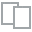
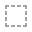
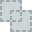
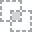
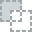
...
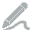
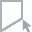
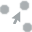
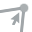
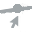

In [34]:
train_eda_report

In [35]:
# It is obvious that ID will not contribute in determining the fraud transactions. Hence dropping id and the Data Columns from 
# both train and test datasets. 

train_df.drop(['id', 'Data'], axis=1, inplace = True)
test_df.drop(['id', 'Data'], axis=1, inplace = True)

In [36]:
# Group also does not impact the target variable as the lambda wts which specifies the proprietary index values.

train_df.drop(['Group'], axis=1, inplace = True)
test_df.drop(['Group'], axis=1, inplace = True)

In [37]:
# Checking the first 10 rows
train_df.head(10)

,Per1,Per2,Per3,Per4,Per5,Per6,Per7,Per8,Per9,Dem1,Dem2,Dem3,Dem4,Dem5,Dem6,Dem7,Dem8,Dem9,Cred1,Cred2,Cred3,Cred4,Cred5,Cred6,Normalised_FNT,Target,geo_score,instance_scores,qsets_normalized_tat,lambda_wt
0,1.070000,0.580000,0.480000,0.766667,1.233333,1.993333,0.340000,1.010000,0.863333,0.460000,0.643333,0.736667,0.756667,0.813333,0.693333,0.666667,0.680000,0.726667,0.606667,1.010000,0.933333,0.603333,0.686667,0.673333,-245.7500,0.0,0.256,-0.06,-0.700,-0.13
1,0.473333,1.206667,0.883333,1.430000,0.726667,0.626667,0.810000,0.783333,0.190000,0.470000,0.613333,0.883333,0.653333,0.463333,0.483333,0.583333,0.716667,0.743333,0.680000,0.690000,0.560000,0.670000,0.553333,0.653333,-248.0000,0.0,-0.250,0.52,0.140,0.66
2,1.130000,0.143333,0.946667,0.123333,0.080000,0.836667,0.056667,0.756667,0.226667,0.660000,0.730000,0.873333,0.923333,1.223333,0.686667,0.606667,0.690000,0.820000,0.600000,0.383333,0.763333,0.670000,0.686667,0.673333,-233.1250,0.0,-0.950,1.56,-0.430,-0.51
3,0.636667,1.090000,0.750000,0.940000,0.743333,0.346667,0.956667,0.633333,0.486667,1.096667,0.466667,0.670000,0.526667,0.783333,0.856667,0.716667,0.720000,0.900000,0.680000,0.846667,0.423333,0.520000,0.846667,0.760000,-249.7775,0.0,0.490,0.70,-0.302,0.72
4,0.560000,1.013333,0.593333,0.416667,0.773333,0.460000,0.853333,0.796667,0.516667,0.756667,0.683333,0.296667,0.780000,0.636667,0.783333,0.630000,0.603333,0.486667,0.693333,0.526667,0.520000,0.716667,0.706667,0.673333,-247.5775,0.0,0.850,-0.47,-0.630,0.60
5,0.873333,0.140000,0.836667,0.273333,0.190000,0.653333,0.503333,0.723333,1.233333,1.150000,0.533333,0.986667,0.513333,0.783333,0.840000,0.823333,0.786667,0.880000,0.553333,0.700000,0.753333,0.700000,0.666667,0.686667,-176.2000,0.0,1.336,-1.16,-0.020,0.14
6,0.980000,0.546667,0.820000,0.863333,0.680000,1.163333,0.486667,0.893333,0.806667,1.300000,0.050000,0.780000,0.223333,-0.010000,0.293333,0.563333,0.650000,0.673333,0.716667,0.393333,0.673333,0.790000,0.676667,0.663333,-242.6275,0.0,0.776,-0.18,1.150,0.59
7,-0.136667,0.360000,0.366667,0.996667,0.473333,0.706667,0.676667,0.933333,0.166667,0.066667,0.783333,0.823333,-0.010000,1.060000,0.666667,0.676667,0.610000,0.563333,0.636667,0.416667,0.523333,0.603333,0.826667,0.626667,-191.0050,0.0,-0.230,0.59,0.760,0.72
8,1.010000,0.606667,0.823333,1.066667,0.516667,0.653333,0.633333,0.703333,0.790000,0.846667,0.343333,0.420000,0.683333,0.726667,0.813333,0.653333,0.603333,0.460000,0.640000,0.660000,0.826667,0.490000,0.670000,0.673333,-229.3475,0.0,0.620,-0.01,-0.380,0.32
9,-0.133333,0.890000,0.210000,0.333333,0.743333,1.023333,0.416667,0.096667,0.403333,0.453333,0.890000,0.306667,0.906667,0.660000,0.703333,0.806667,0.263333,0.840000,0.600000,0.140000,0.526667,0.973333,0.700000,0.616667,-217.2425,0.0,1.210,-1.33,-0.420,1.02


In [38]:
# Checking the last 10 rows
train_df.tail(10)

,Per1,Per2,Per3,Per4,Per5,Per6,Per7,Per8,Per9,Dem1,Dem2,Dem3,Dem4,Dem5,Dem6,Dem7,Dem8,Dem9,Cred1,Cred2,Cred3,Cred4,Cred5,Cred6,Normalised_FNT,Target,geo_score,instance_scores,qsets_normalized_tat,lambda_wt
227835,1.306667,0.906667,0.153333,1.836667,1.046667,0.616667,0.903333,0.613333,0.080000,0.870000,0.513333,0.236667,0.920000,0.640000,0.256667,0.583333,0.716667,0.763333,0.690000,0.913333,0.750000,0.673333,0.636667,0.646667,-244.3250,0.0,0.130,1.75,-0.980,0.97
227836,0.736667,0.123333,0.996667,1.156667,0.090000,0.676667,0.563333,0.726667,0.860000,1.060000,0.290000,1.023333,1.006667,1.096667,0.426667,0.920000,0.860000,0.863333,0.516667,0.846667,0.700000,0.556667,0.660000,0.703333,-132.4900,0.0,0.260,-0.07,-0.850,0.41
227837,0.470000,-0.420000,0.720000,0.966667,0.116667,1.070000,0.733333,0.763333,0.950000,1.086667,0.486667,0.543333,0.553333,0.400000,0.563333,1.193333,0.796667,0.476667,0.460000,0.603333,0.543333,0.953333,0.610000,0.716667,-32.6650,0.0,1.160,-0.69,0.490,0.00
227838,0.523333,0.603333,1.410000,0.783333,0.403333,0.876667,0.756667,0.696667,1.086667,0.010000,0.316667,0.233333,0.520000,0.720000,0.876667,0.726667,0.703333,0.900000,0.653333,0.646667,0.550000,0.860000,0.656667,0.646667,-222.1250,0.0,-0.384,-0.67,0.070,-1.04
227839,1.080000,0.760000,0.726667,0.833333,0.610000,0.480000,0.653333,0.656667,0.606667,1.100000,0.673333,0.813333,0.926667,0.776667,0.740000,0.643333,0.580000,0.403333,0.693333,0.650000,0.740000,0.700000,0.656667,0.673333,-249.6775,0.0,0.756,-0.11,-0.370,-0.08
227840,0.476667,1.013333,0.536667,0.576667,1.406667,1.846667,0.600000,1.103333,0.356667,0.530000,0.683333,1.096667,0.750000,0.860000,0.936667,0.680000,0.683333,0.630000,0.633333,0.996667,0.646667,0.533333,0.680000,0.693333,-246.5025,0.0,-0.140,-0.44,-0.546,0.75
227841,1.363333,0.730000,0.060000,0.776667,0.883333,0.466667,0.733333,0.590000,0.806667,0.436667,0.906667,0.736667,0.773333,0.543333,0.696667,0.630000,0.543333,0.356667,0.766667,0.730000,0.596667,0.730000,0.646667,0.656667,-249.7775,0.0,0.426,-0.40,0.384,-0.98
227842,1.060000,0.756667,0.906667,0.896667,0.503333,0.396667,0.683333,0.620000,0.630000,0.870000,0.986667,1.053333,0.606667,0.246667,0.440000,0.633333,0.603333,0.510000,0.740000,0.873333,0.700000,0.696667,0.663333,0.673333,-249.7775,0.0,1.066,-0.13,0.010,0.15
227843,0.433333,1.013333,1.163333,0.940000,0.930000,0.900000,0.813333,0.720000,1.020000,0.413333,1.043333,0.720000,0.610000,0.930000,0.873333,0.736667,0.606667,0.606667,0.540000,0.643333,0.906667,0.540000,0.766667,0.710000,-242.7500,0.0,-3.290,-0.66,0.384,1.53
227844,1.006667,0.553333,0.946667,1.206667,0.406667,0.750000,0.520000,0.756667,1.053333,0.273333,-0.046667,0.503333,0.426667,0.453333,0.580000,0.593333,0.640000,0.646667,0.636667,0.683333,0.843333,0.580000,0.683333,0.676667,-235.0000,0.0,-0.360,-0.22,0.550,0.00


In [39]:
# Checking the number of rows and columns.

print('Total number of observations/rows are:', train_df.shape[0])
print('Total number of features/columns are: ', train_df.shape[1])

Total number of observations/rows are: 227845
Total number of features/columns are:  30


In [40]:
# Checking the basic info of the data.

train_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 227845 entries, 0 to 227844
Data columns (total 30 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Per1                  227845 non-null  float64
 1   Per2                  227845 non-null  float64
 2   Per3                  227845 non-null  float64
 3   Per4                  227845 non-null  float64
 4   Per5                  227845 non-null  float64
 5   Per6                  227845 non-null  float64
 6   Per7                  227845 non-null  float64
 7   Per8                  227845 non-null  float64
 8   Per9                  227845 non-null  float64
 9   Dem1                  227845 non-null  float64
 10  Dem2                  227845 non-null  float64
 11  Dem3                  227845 non-null  float64
 12  Dem4                  227845 non-null  float64
 13  Dem5                  227845 non-null  float64
 14  Dem6                  227845 non-null  float64
 15  

In [41]:
# Checking the data description of all the variables, which gives us the count, mean, std, minimum, 25th quartile, 
# median, 75th quartile and maximum values in the respective numerical columns.

train_df.describe().T

,count,mean,std,min,25%,50%,75%,max
Per1,227845.0,0.666006,0.654133,-18.136667,0.360000,0.670000,1.103333,1.483333
Per2,227845.0,0.667701,0.548305,-23.573333,0.470000,0.690000,0.933333,8.020000
Per3,227845.0,0.666315,0.506357,-15.443333,0.370000,0.726667,1.010000,3.793333
Per4,227845.0,0.666687,0.471956,-1.226667,0.383333,0.660000,0.913333,6.163333
Per5,227845.0,0.666723,0.461393,-37.246667,0.436667,0.650000,0.870000,12.266667
Per6,227845.0,0.667378,0.444573,-8.053333,0.410000,0.576667,0.800000,25.100000
Per7,227845.0,0.666934,0.415657,-13.853333,0.483333,0.680000,0.856667,40.863333
Per8,227845.0,0.666279,0.401546,-23.740000,0.596667,0.673333,0.776667,7.336667
Per9,227845.0,0.666688,0.366537,-3.810000,0.453333,0.650000,0.866667,5.863333
Dem1,227845.0,0.666576,0.340436,-0.893333,0.413333,0.656667,0.913333,4.673333


# Data Preprocessing

## Handling missing values

The misssing values are aready handled in the individual tables before the merge.

In [42]:
# Checking what percent of values are missing in each feature.

pd.DataFrame(train_df.isnull().sum()/len(train_df)*100, columns=['Missing Value %'], index = train_df.columns)

,Missing Value %
Per1,0.0
Per2,0.0
Per3,0.0
Per4,0.0
Per5,0.0
Per6,0.0
Per7,0.0
Per8,0.0
Per9,0.0
Dem1,0.0


In [43]:
# Data Types of each variable:

pd.DataFrame(train_df.dtypes, columns=['Datatype'], index = train_df.columns)

,Datatype
Per1,float64
Per2,float64
Per3,float64
Per4,float64
Per5,float64
Per6,float64
Per7,float64
Per8,float64
Per9,float64
Dem1,float64


## Handling Outliers

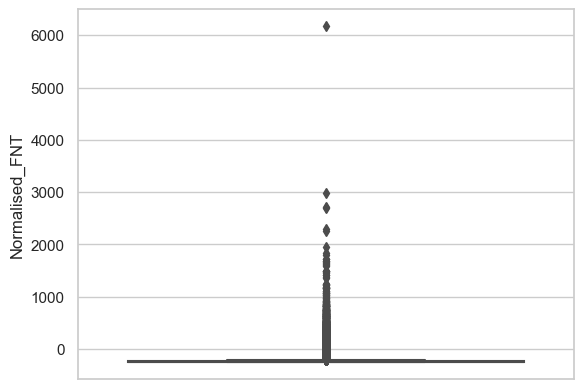

In [44]:
# Here it can be observed from the above data description that only Normalised_FNT might potentially have outliers present, hence checking the same:

sns.boxplot(data=train_df, y='Normalised_FNT')
plt.show()

In [45]:
train_df['Normalised_FNT'].describe()

count    227845.000000
mean       -227.954170
std          61.951661
min        -250.000000
25%        -248.617500
50%        -244.510000
75%        -230.750000
max        6172.790000
Name: Normalised_FNT, dtype: float64

In [46]:
# Now to find the maximum limit using inter quartile method:

Q1 = -248.617500
Q3 = -230.750000
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
print(lower_limit)
print(upper_limit)

-275.41875000000005
-203.94875


In [47]:
# Checking how many observations are outliers (above the upper limit):

train_df[train_df['Normalised_FNT'] > upper_limit].count()[0]

25486

Since there are 25486 values which are outliers, we might not handle them for now as these values might be critical in determining if the transaction is a fraudulent one.

### Splitting the data into independent variables and dependent variables

In [48]:
x = train_df.drop('Target', axis=1)
y = train_df['Target']

## Feature Scaling

In [49]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x_sc = scaler.fit_transform(x)

In [50]:
x_sc

array([[ 6.17603382e-01, -1.59949449e-01, -3.67953077e-01, ...,
        -5.48582452e-02, -8.24950841e-01, -1.36070832e-01],
       [-2.94547070e-01,  9.82969984e-01,  4.28587917e-01, ...,
         4.76527663e-01,  1.63090340e-01,  6.88602704e-01],
       [ 7.09328008e-01, -9.56345437e-01,  5.53664602e-01, ...,
         1.42935757e+00, -5.07366176e-01, -5.32749242e-01],
       ...,
       [ 6.02315944e-01,  1.62256561e-01,  4.74668801e-01, ...,
        -1.18991027e-01,  1.01792044e-02,  1.56218522e-01],
       [-3.55696821e-01,  6.30367180e-01,  9.81558524e-01, ...,
        -6.04567805e-01,  4.50092778e-01,  1.59678748e+00],
       [ 5.20782943e-01, -2.08584319e-01,  5.53664602e-01, ...,
        -2.01447461e-01,  6.45348535e-01, -3.65060454e-04]])

In [51]:
y.value_counts()

0.0    227451
1.0       394
Name: Target, dtype: int64

In [52]:
# Checking the percentage of fraudulent transactions out of entire data:

fraud_percent = round((394/(227451+394))*100,3)
valid_transaction_percent = round((227451/(227451+394))*100,3)
print("Percentage of valid transcation is: ",valid_transaction_percent,"%", sep='')
print("Percentage of fraud transcation is: ",fraud_percent,"%", sep='')

Percentage of valid transcation is: 99.827%
Percentage of fraud transcation is: 0.173%


Only 0.17% of the recorded transactions are fraudulent.

# Imbalance Treatment of the Target variable

In [53]:
y.value_counts()

0.0    227451
1.0       394
Name: Target, dtype: int64

In [55]:
from imblearn.over_sampling import RandomOverSampler
ros = RandomOverSampler()
x_bal, y_bal = ros.fit_resample(x_sc, y)
print(y.value_counts()) # data before balancing
print(y_bal.value_counts()) # target variable after balancing

0.0    227451
1.0       394
Name: Target, dtype: int64
0.0    227451
1.0    227451
Name: Target, dtype: int64


### Splitting the balanced data into train and test

In [57]:
from sklearn.model_selection import train_test_split, cross_val_score

x_train, x_test, y_train, y_test = train_test_split(x_bal, y_bal, test_size = 0.25, random_state = 101)

In [58]:
# importing necessary models from sklearn for model building:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

# Importing performance metrics
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, recall_score

# Logistic Regression

In [59]:
# Building Binary classification Logistic regression model.

logit = LogisticRegression()
logit.fit(x_train, y_train)
pred_train_logit = logit.predict(x_train)
pred_test_logit = logit.predict(x_test)

In [60]:
print("Classification Report, Confusion matrix, Accuracy score and Recall_Score for Train data using Logistic Regression model:")
print(classification_report(y_train, pred_train_logit))
print('\n')
print(confusion_matrix(y_train, pred_train_logit))
print('\n')
print("Accuracy Score:",accuracy_score(y_train, pred_train_logit))
print('\n')
print("Recall Score:",recall_score(y_train, pred_train_logit))

Classification Report, Confusion matrix, Accuracy score and Recall_Score for Train data using Logistic Regression model:
              precision    recall  f1-score   support

         0.0       0.92      0.98      0.95    170627
         1.0       0.97      0.91      0.94    170549

    accuracy                           0.94    341176
   macro avg       0.95      0.94      0.94    341176
weighted avg       0.95      0.94      0.94    341176



[[166390   4237]
 [ 15044 155505]]


Accuracy Score: 0.9434866461884776


Recall Score: 0.9117907463544201


In [61]:
print("Classification Report, Confusion matrix, Accuracy score and Recall_Score for Test data using Logistic Regression model:")
print(classification_report(y_test, pred_test_logit))
print('\n')
print(confusion_matrix(y_test, pred_test_logit))
print('\n')
print("Accuracy Score:",accuracy_score(y_test, pred_test_logit))
print('\n')
print("Recall Score:",recall_score(y_test, pred_test_logit))

Classification Report, Confusion matrix, Accuracy score and Recall_Score for Test data using Logistic Regression model:
              precision    recall  f1-score   support

         0.0       0.92      0.98      0.94     56824
         1.0       0.97      0.91      0.94     56902

    accuracy                           0.94    113726
   macro avg       0.94      0.94      0.94    113726
weighted avg       0.94      0.94      0.94    113726



[[55407  1417]
 [ 5048 51854]]


Accuracy Score: 0.9431528410389884


Recall Score: 0.911286070788373


In [62]:
# Cross Validation test for the model:

accuracy_logit_train = cross_val_score(estimator=logit, X=x_train, y=y_train, cv=10, scoring='accuracy')
accuracy_logit_test = cross_val_score(estimator=logit, X=x_test, y=y_test, cv=10, scoring='accuracy')
print("Cross Validation Score for Train data", np.mean(accuracy_logit_train))
print("Cross Validation Score for Test data", np.mean(accuracy_logit_test))

Cross Validation Score for Train data 0.9434895765280686
Cross Validation Score for Test data 0.9429505913367272


# Random Forest Model

In [63]:
rfc = RandomForestClassifier(n_estimators=100)
rfc.fit(x_train, y_train)
pred_train_rfc = rfc.predict(x_train)
pred_test_rfc = rfc.predict(x_test)

In [64]:
print("Classification Report, Confusion matrix, Accuracy score and Recall_Score for Train data using Random Forest model:")
print(classification_report(y_train, pred_train_rfc))
print('\n')
print(confusion_matrix(y_train, pred_train_rfc))
print('\n')
print("Accuracy Score:",accuracy_score(y_train, pred_train_rfc))
print('\n')
print("Recall Score:",recall_score(y_train, pred_train_rfc))

Classification Report, Confusion matrix, Accuracy score and Recall_Score for Train data using Random Forest model:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00    170627
         1.0       1.00      1.00      1.00    170549

    accuracy                           1.00    341176
   macro avg       1.00      1.00      1.00    341176
weighted avg       1.00      1.00      1.00    341176



[[170627      0]
 [     0 170549]]


Accuracy Score: 1.0


Recall Score: 1.0


In [65]:
print("Classification Report, Confusion matrix, Accuracy score and Recall_Score for Test data using Logistic Random Forest model:")
print(classification_report(y_test, pred_test_rfc))
print('\n')
print(confusion_matrix(y_test, pred_test_rfc))
print('\n')
print("Accuracy Score:",accuracy_score(y_test, pred_test_rfc))
print('\n')
print("Recall Score:",recall_score(y_test, pred_test_rfc))

Classification Report, Confusion matrix, Accuracy score and Recall_Score for Test data using Logistic Random Forest model:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     56824
         1.0       1.00      1.00      1.00     56902

    accuracy                           1.00    113726
   macro avg       1.00      1.00      1.00    113726
weighted avg       1.00      1.00      1.00    113726



[[56817     7]
 [    0 56902]]


Accuracy Score: 0.9999384485517824


Recall Score: 1.0


In [66]:
# Cross Validation test for the model:

accuracy_rfc_train = cross_val_score(estimator=rfc, X=x_train, y=y_train, cv=10, scoring='accuracy')
accuracy_rfc_test = cross_val_score(estimator=rfc, X=x_test, y=y_test, cv=10, scoring='accuracy')
print("Cross Validation Score for Train data", np.mean(accuracy_rfc_train))
print("Cross Validation Score for Test data", np.mean(accuracy_rfc_test))

Cross Validation Score for Train data 0.999953103332035
Cross Validation Score for Test data 0.9998593120577122


# XG Boost Classifier Model

In [67]:
xgbc = XGBClassifier()
xgbc.fit(x_train, y_train)
pred_train_xgbc = xgbc.predict(x_train)
pred_test_xgbc = xgbc.predict(x_test)

In [68]:
print("Classification Report, Confusion matrix, Accuracy score and Recall_Score for Train data using XG Boost Classifier model:")
print(classification_report(y_train, pred_train_xgbc))
print('\n')
print(confusion_matrix(y_train, pred_train_xgbc))
print('\n')
print("Accuracy Score:",accuracy_score(y_train, pred_train_xgbc))
print('\n')
print("Recall Score:",recall_score(y_train, pred_train_xgbc))

Classification Report, Confusion matrix, Accuracy score and Recall_Score for Train data using XG Boost Classifier model:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00    170627
         1.0       1.00      1.00      1.00    170549

    accuracy                           1.00    341176
   macro avg       1.00      1.00      1.00    341176
weighted avg       1.00      1.00      1.00    341176



[[170627      0]
 [     0 170549]]


Accuracy Score: 1.0


Recall Score: 1.0


In [69]:
print("Classification Report, Confusion matrix, Accuracy score and Recall_Score for Test data using Logistic XG Boost Classifier model:")
print(classification_report(y_test, pred_test_xgbc))
print('\n')
print(confusion_matrix(y_test, pred_test_xgbc))
print('\n')
print("Accuracy Score:",accuracy_score(y_test, pred_test_xgbc))
print('\n')
print("Recall Score:",recall_score(y_test, pred_test_xgbc))

Classification Report, Confusion matrix, Accuracy score and Recall_Score for Test data using Logistic XG Boost Classifier model:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     56824
         1.0       1.00      1.00      1.00     56902

    accuracy                           1.00    113726
   macro avg       1.00      1.00      1.00    113726
weighted avg       1.00      1.00      1.00    113726



[[56810    14]
 [    0 56902]]


Accuracy Score: 0.9998768971035648


Recall Score: 1.0


In [70]:
# Cross Validation test for the model:

accuracy_xgbc_train = cross_val_score(estimator=xgbc, X=x_train, y=y_train, cv=10, scoring='accuracy')
accuracy_xgbc_test = cross_val_score(estimator=xgbc, X=x_test, y=y_test, cv=10, scoring='accuracy')
print("Cross Validation Score for Train data", np.mean(accuracy_xgbc_train))
print("Cross Validation Score for Test data", np.mean(accuracy_xgbc_test))

Cross Validation Score for Train data 0.9999237930326836
Cross Validation Score for Test data 0.9997801733988148


# Checking performance of the model using ROC-AUC Curve

In [71]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve

In [72]:
rfc_roc_under_auc = roc_auc_score(y_test,pred_test_rfc)

In [73]:
rfc_roc_under_auc

0.9999384063071942

In [74]:
fpr, tpr, thres = roc_curve(y_test, pred_test_rfc)
display(fpr[:10])
display(tpr[:10])
display(thres[:10])

array([0.00000000e+00, 1.23187386e-04, 1.00000000e+00])

array([0., 1., 1.])

array([inf,  1.,  0.])

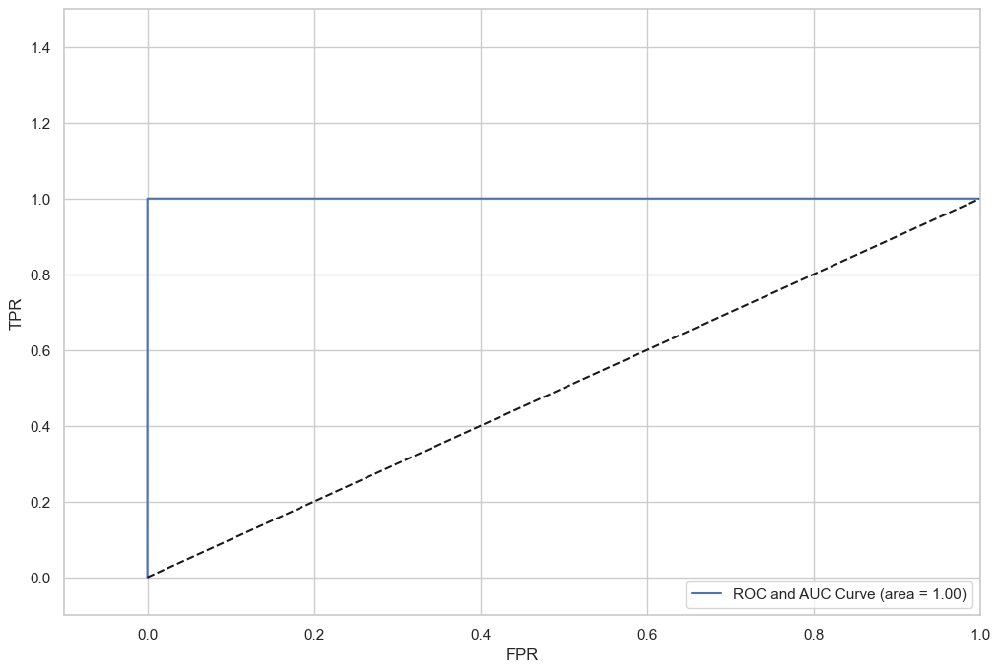

In [75]:
plt.figure(figsize=(12,8))
plt.plot(fpr, tpr, label = 'ROC and AUC Curve (area = %0.2f)' % rfc_roc_under_auc)
plt.plot([0,1],[0,1], 'k--')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.xlim([-0.1,1.0])
plt.ylim([-0.1,1.5])
plt.legend(loc='lower right')
plt.show()

## Concluding: Since the model is showing remarkable performance in the ROC-AUC Curve, the model using Random Forest with Train accuracy of 100% and Test accuracy of 99.99% and Cross Validation mean Accuracy scores for training and test data is 99.995% and 99.986% respectively, Hence the model can be said to be giving striking performance and can be used for deployment in production.

## Note: Since this is a Fraud detection model, the False Negative value should be as low as possible as we would not want to classify a transaction as not fraudulent when they are actually fraudulent.

### Now predicting the model using the test data:

In [77]:
# Removing the Target column from test_df

test_df.drop('Target', axis = 1, inplace = True)

In [78]:
test_df.head()

,Per1,Per2,Per3,Per4,Per5,Per6,Per7,Per8,Per9,Dem1,Dem2,Dem3,Dem4,Dem5,Dem6,Dem7,Dem8,Dem9,Cred1,Cred2,Cred3,Cred4,Cred5,Cred6,Normalised_FNT,geo_score,instance_scores,qsets_normalized_tat,lambda_wt
227845,-0.300000,1.540000,0.220000,-0.280000,0.570000,0.260000,0.700000,1.076667,0.930000,0.156667,0.546667,0.530000,0.876667,0.450000,0.370000,0.786667,0.546667,0.313333,0.703333,0.813333,0.776667,0.796667,0.823333,0.783333,-249.7500,0.25,-0.04,-0.426,0.76
227846,0.633333,0.953333,0.810000,0.466667,0.910000,0.253333,1.040000,0.550000,0.543333,0.433333,0.966667,0.760000,0.576667,0.653333,0.553333,0.636667,0.770000,0.993333,0.536667,0.703333,0.806667,0.630000,0.673333,0.673333,-249.8125,0.43,-0.77,-0.620,0.18
227847,1.043333,0.740000,0.860000,1.006667,0.583333,0.616667,0.630000,0.686667,0.593333,1.250000,0.826667,0.826667,0.653333,0.663333,0.453333,0.626667,0.756667,0.953333,0.623333,0.753333,0.870000,0.596667,0.680000,0.670000,-248.1200,1.32,0.11,-0.406,0.39
227848,1.283333,0.300000,0.576667,0.636667,0.256667,0.543333,0.356667,0.663333,1.156667,1.186667,0.900000,0.433333,0.230000,1.323333,0.403333,0.480000,0.460000,0.260000,0.800000,0.606667,0.456667,0.320000,0.676667,0.660000,-222.9875,-2.11,0.33,0.374,1.80
227849,1.186667,0.326667,0.476667,0.866667,0.436667,0.680000,0.476667,0.686667,1.476667,1.213333,0.853333,0.583333,0.850000,1.090000,0.550000,0.706667,0.740000,0.823333,0.670000,0.896667,0.566667,0.546667,0.650000,0.663333,-196.2200,-2.11,-0.37,-0.130,1.89


In [79]:
pred_test_rfc = rfc.predict(scaler.transform(test_df))

In [80]:
test_df['Predicted'] = pred_test_rfc

In [81]:
pd.DataFrame(test_df['Predicted'].value_counts())

,Predicted
0.0,56872
1.0,90


In [82]:
test_df[test_df['Predicted'] == 1.0].head(20)

,Per1,Per2,Per3,Per4,Per5,Per6,Per7,Per8,Per9,Dem1,Dem2,Dem3,Dem4,Dem5,Dem6,Dem7,Dem8,Dem9,Cred1,Cred2,Cred3,Cred4,Cred5,Cred6,Normalised_FNT,geo_score,instance_scores,qsets_normalized_tat,lambda_wt,Predicted
228121,-1.300000,2.146667,-2.210000,3.263333,-0.996667,0.266667,-1.890000,2.043333,-1.106667,2.073333,1.110000,0.356667,-1.696667,-0.916667,1.600000,0.496667,1.260000,1.090000,0.600000,0.670000,0.666667,0.846667,0.276667,0.263333,-238.6225,-6.374,-4.89,-12.620,-5.85,1.0
228229,0.526667,2.233333,-1.840000,3.223333,0.753333,-0.216667,-0.283333,0.986667,-0.863333,2.183333,0.586667,1.030000,-0.346667,0.613333,0.930000,0.943333,0.873333,0.520000,0.636667,0.420000,0.563333,0.833333,0.940000,0.790000,-249.8075,-7.768,-6.12,-3.010,-13.20,1.0
230343,-3.730000,4.930000,-2.636667,1.773333,-0.933333,2.586667,-5.583333,-11.783333,0.536667,2.136667,0.030000,0.590000,-1.403333,-0.383333,0.683333,-0.496667,9.733333,-2.296667,2.433333,0.453333,0.753333,0.630000,1.090000,0.980000,-249.7500,-4.610,-5.05,-6.246,-9.07,1.0
230497,-0.733333,0.730000,-0.640000,1.973333,0.040000,-0.040000,-0.536667,1.230000,-0.063333,2.126667,0.233333,1.000000,-0.440000,0.320000,1.076667,1.000000,0.933333,0.606667,0.520000,0.763333,0.620000,0.583333,1.083333,0.623333,-190.2750,-5.010,-4.68,-6.190,-6.19,1.0
231658,-0.050000,1.396667,-0.476667,0.706667,0.610000,0.763333,-0.270000,-0.226667,0.480000,1.300000,0.340000,0.436667,-0.183333,0.646667,1.163333,0.843333,0.643333,0.853333,0.640000,0.520000,0.783333,0.493333,0.713333,0.676667,-237.5000,-2.640,-4.49,-3.480,-4.69,1.0
233094,-0.650000,1.626667,-1.473333,1.476667,0.223333,-0.040000,-0.410000,0.436667,0.926667,2.306667,1.173333,0.783333,-0.843333,0.036667,0.723333,0.443333,1.136667,0.760000,0.856667,0.886667,0.566667,0.530000,0.206667,1.126667,-236.8275,-8.750,-4.72,-6.470,-8.55,1.0
233851,-0.116667,1.170000,-0.216667,1.250000,0.803333,-0.063333,0.436667,0.483333,0.633333,1.390000,0.740000,0.720000,-0.126667,0.076667,0.490000,0.636667,0.636667,0.466667,0.753333,0.686667,0.550000,0.283333,0.420000,0.910000,-248.7750,-3.100,-1.67,-4.170,-6.03,1.0
233890,0.343333,1.366667,-1.073333,2.836667,-0.730000,1.370000,0.983333,-0.150000,-0.400000,1.016667,0.856667,0.556667,0.050000,0.390000,0.983333,1.050000,0.386667,0.933333,1.103333,0.550000,0.076667,0.700000,0.986667,0.720000,-18.6725,-3.470,-3.07,-2.416,-5.25,1.0
235342,-4.423333,3.443333,-6.780000,4.630000,-2.240000,-0.106667,-4.733333,0.836667,-1.443333,3.980000,0.906667,0.556667,-2.020000,-0.933333,0.896667,0.996667,-0.120000,1.023333,1.030000,0.320000,0.606667,0.883333,1.383333,0.196667,-249.7500,-14.230,-13.18,-12.116,-14.00,1.0
235731,-5.316667,4.356667,-6.246667,2.693333,-3.796667,-0.843333,-4.396667,4.700000,-0.676667,2.690000,0.666667,0.673333,-1.783333,-0.996667,1.116667,1.236667,1.266667,0.240000,0.430000,0.700000,1.060000,0.586667,1.183333,0.850000,-249.7500,-8.570,-9.02,-13.916,-9.30,1.0


# As per the model there are only 90 out of 56962 transactions that are classified as potentially fraudulent transactions

# Solving the problem using Anomaly Detection

The use of implementing an anomaly detection model in fraud detection is to automatically identify and flag unusual or potentially fraudulent activities within a dataset. It helps detect fraudulent transactions, behaviors, or events that deviate significantly from the expected or normal patterns, allowing organizations to take action and prevent financial losses or security breaches.

An anomaly detection algorithm in fraud detection is a specific method or technique used to find these anomalies or outliers within the data. It leverages statistical, machine learning, or deep learning approaches to distinguish between normal and abnormal data points. Examples of such algorithms include Isolation Forest, One-Class SVM, and clustering-based methods, which aim to identify suspicious activities that may indicate fraudulent behavior.

In [83]:
fraud_percent1 = (394/(227451+394))
fraud_percent1

0.001729245759178389

In [84]:
# Considering the train data before balancing target variable using Random Over Sampling technique

In [85]:
x_train1, x_test1, y_train1, y_test1 = train_test_split(x_sc, y, test_size = 0.25, random_state = 101)

In [86]:
from sklearn.ensemble import IsolationForest

# Create an Isolation Forest instance
isolation_forest = IsolationForest(contamination=fraud_percent1)

# Fit the model to your train data
isolation_forest.fit(x_train1)

IsolationForest(contamination=0.001729245759178389)

In [87]:
y_pred = isolation_forest.predict(x_test1)

In [88]:
# Count the number of outliers

n_outliers = np.sum(y_pred == -1)
print(n_outliers)

89


In [89]:
# Get the indices of the outliers

outlier_indices = np.where(y_pred == -1)[0]
print(outlier_indices)

[  247   409   969  1330  2467  2568  2817  3258  4301  4852  5881  6066
  6241  6789  7234  8325  8722  8750  9902 11852 12516 12538 12926 14063
 14395 16983 17331 19337 19857 20579 21046 21989 22265 22343 22531 22615
 23248 23567 24088 24482 25924 27428 27444 27728 29001 29088 29861 30012
 30035 31094 31982 32445 32481 32617 32861 33771 34950 37218 37418 37579
 38446 39831 41072 41206 41419 41634 42191 42738 42745 43521 44437 45360
 45705 47639 48144 48282 48774 50728 50812 51616 51618 52954 53907 54057
 54553 55183 55640 56344 56742]


In [90]:
test_df.drop('Predicted', axis=1, inplace = True)

In [91]:
# Predicting the Fraudulent transactions for test data

y_pred_test = isolation_forest.predict(scaler.transform(test_df))

In [92]:
# Number of Fraud Transactions as per the prediction model

n_outliers_test = np.sum(y_pred_test == -1)
print("Number of Fraud Transactions as per the prediction model out of 56962 transactions:",n_outliers_test)

Number of Fraud Transactions as per the prediction model out of 56962 transactions: 80


In [93]:
# Fetching the indices of the flagged transactions

outlier_indices_test = np.where(y_pred_test == -1)[0]

In [94]:
# Below are the 20 transactions out of 9765 flagged as fraudulent (potentially)

test_df.reset_index(drop=True, inplace = True)
selected_data = test_df.loc[outlier_indices_test]
selected_data.head(20)

,Per1,Per2,Per3,Per4,Per5,Per6,Per7,Per8,Per9,Dem1,Dem2,Dem3,Dem4,Dem5,Dem6,Dem7,Dem8,Dem9,Cred1,Cred2,Cred3,Cred4,Cred5,Cred6,Normalised_FNT,geo_score,instance_scores,qsets_normalized_tat,lambda_wt
276,-1.300000,2.146667,-2.210000,3.263333,-0.996667,0.266667,-1.890000,2.043333,-1.106667,2.073333,1.110000,0.356667,-1.696667,-0.916667,1.600000,0.496667,1.260000,1.090000,0.600000,0.670000,0.666667,0.846667,0.276667,0.263333,-238.6225,-6.374,-4.89,-12.620,-5.85
442,-2.370000,-4.483333,-1.570000,0.706667,-2.713333,2.963333,5.793333,0.280000,0.673333,0.890000,1.000000,0.526667,0.686667,0.893333,-0.030000,4.190000,1.620000,0.570000,4.663333,-0.080000,0.573333,0.246667,0.176667,0.833333,934.6975,0.560,-5.61,-0.816,0.38
751,-4.473333,-3.760000,0.256667,2.106667,2.600000,0.356667,0.770000,-0.136667,1.833333,1.570000,1.533333,1.036667,1.543333,0.206667,0.726667,-3.440000,-0.706667,1.423333,3.573333,0.253333,1.500000,1.720000,2.340000,-0.133333,-195.7150,-2.870,3.86,-1.040,-0.94
1829,-4.213333,-8.850000,-3.570000,2.626667,-1.953333,1.490000,4.640000,-0.216667,-0.073333,0.780000,0.990000,0.690000,1.210000,0.933333,0.160000,6.606667,2.596667,-0.423333,-2.006667,0.806667,-0.133333,0.456667,0.080000,1.140000,1946.7500,-0.200,-2.97,0.348,2.68
1986,-2.486667,-0.513333,-2.200000,0.813333,-4.326667,3.240000,4.780000,-0.150000,0.973333,0.476667,1.233333,0.946667,1.736667,-0.053333,1.463333,-2.610000,-0.433333,1.016667,0.893333,1.073333,0.046667,0.373333,0.243333,0.636667,422.5600,-0.920,1.08,-0.162,-1.42
2498,-3.730000,4.930000,-2.636667,1.773333,-0.933333,2.586667,-5.583333,-11.783333,0.536667,2.136667,0.030000,0.590000,-1.403333,-0.383333,0.683333,-0.496667,9.733333,-2.296667,2.433333,0.453333,0.753333,0.630000,1.090000,0.980000,-249.7500,-4.610,-5.05,-6.246,-9.07
3495,-10.556667,-15.143333,-1.733333,4.020000,10.340000,-6.016667,-5.460000,1.266667,1.220000,0.866667,1.306667,1.086667,0.983333,0.113333,0.443333,2.790000,1.493333,0.153333,-0.603333,0.643333,0.036667,0.516667,0.923333,0.070000,-212.0000,2.920,2.71,1.020,2.74
5331,-10.850000,-19.486667,-6.446667,6.293333,-5.743333,2.780000,8.806667,-0.986667,0.730000,0.640000,1.913333,1.526667,1.676667,2.236667,-1.646667,13.373333,4.500000,-2.500000,-4.836667,0.913333,-1.693333,-0.200000,-0.516667,1.750000,4477.5000,-2.280,-8.91,0.530,5.99
5729,-3.023333,3.893333,-1.473333,0.600000,-0.973333,2.263333,-4.473333,-7.506667,-0.306667,0.126667,-0.223333,0.400000,1.770000,1.056667,0.163333,3.113333,-3.983333,1.813333,1.650000,0.393333,0.583333,0.653333,0.493333,0.756667,-249.5050,4.060,-4.54,1.964,6.93
5829,-5.120000,-3.500000,-0.400000,1.666667,0.410000,1.083333,2.206667,-0.880000,2.600000,1.700000,0.653333,1.316667,1.183333,0.090000,0.156667,-2.396667,-0.426667,0.706667,-2.423333,0.890000,0.250000,0.216667,-1.713333,1.460000,-98.0750,-0.020,5.87,-2.450,-3.77
